<a href="https://colab.research.google.com/github/Aritro30/RANSAC-and-Panorama-Stiching/blob/main/CPSC425Assignment4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Q1: SIFT Keypoint Matching


In [ ]:
import numpy as np
import cv2
import math
import random

Contents of solution.py

In [ ]:
def RANSACFilter(
        matched_pairs, keypoints1, keypoints2,
        orient_agreement, scale_agreement):
    """
    This function takes in `matched_pairs`, a list of matches in indices
    and return a subset of the pairs using RANSAC.
    Inputs:
        matched_pairs: a list of tuples [(i, j)],
            indicating keypoints1[i] is matched
            with keypoints2[j]
        keypoints1, 2: keypoints from image 1 and image 2
            stored in np.array with shape (num_pts, 4)
            each row: row, col, scale, orientation
        *_agreement: thresholds for defining inliers, floats
    Output:
        largest_set: the largest consensus set in [(i, j)] format

    HINTS: the "*_agreement" definitions are well-explained
           in the assignment instructions.
    """
    assert isinstance(matched_pairs, list)
    assert isinstance(keypoints1, np.ndarray)
    assert isinstance(keypoints2, np.ndarray)
    assert isinstance(orient_agreement, float)
    assert isinstance(scale_agreement, float)
    ## START
    #largest_set is a list that contains the largest consensus set
    largest_set = []
    #max stores the length of biggest consensus set. Initialized with -1
    max = -1
    #RANSAC iteration = 10 times
    for k in range(10):
      #selected_index1, selected_index2 stores the indices of the only randomly selected matching keypoints between image1 and image2
      selected_index1, selected_index2 = random.choice(matched_pairs)
      #the selected keypoint from image1 is stored in selected_choice1
      selected_choice1 = keypoints1[selected_index1]
      #the selected keypoint from image2 is stored in selected_choice2
      selected_choice2 = keypoints2[selected_index2]
      #change of scale of first match is determined
      scale_first_match = selected_choice2[2]/selected_choice1[2]
      #the second match must have change in scale within the range of lower_limit to upper_limit
      upper_limit = scale_first_match + scale_agreement * scale_first_match
      lower_limit = scale_first_match - scale_agreement * scale_first_match
      #difference in orientation is calculated for the first match
      d1 = selected_choice2[3] - selected_choice1[3]
      #the first match is added to the consensus set
      consensus_set = []
      consensus_set.append((selected_index1, selected_index2))
      #checking all the other matches for consistency with the first match
      for (i,j) in matched_pairs: 
        #x,y are keypoint matches from image1 and image2 respectively
        x = keypoints1[i]
        y = keypoints2[j]
        #difference in orientation is calculated for the other match
        d2 = y[3] - x[3]
        #difference between the two matches is calculated 
        difference_orientation = abs(d2 - d1)
        #the appropriate conditions mentioned in the question are checked
        if (difference_orientation <= math.radians(orient_agreement) or difference_orientation >= (2.0*math.pi - math.radians(orient_agreement)) ) and (y[2]/x[2]) < upper_limit and (y[2]/x[2]) > lower_limit:
          #if the condition is true, the pair is added to the consensus set as inlier
          consensus_set.append((i,j))     
      #if it is the first iteration among the 10, then maximum length is the current length of consensus set
      if k == 0:
        max = len(consensus_set)
        largest_set = (consensus_set)
      #if the length of the consensus set after each iteration is higher than max, max gets updated with the current length
      #largest_set gets updated with the consensus set
      if len(consensus_set) > max: 
        max = len(consensus_set)
        largest_set = (consensus_set)      
    ## END
    assert isinstance(largest_set, list)
    return largest_set



def FindBestMatches(descriptors1, descriptors2, threshold):
    """
    This function takes in descriptors of image 1 and image 2,
    and find matches between them. See assignment instructions for details.
    Inputs:
        descriptors: a K-by-128 array, where each row gives a descriptor
        for one of the K keypoints.  The descriptor is a 1D array of 128
        values with unit length.
        threshold: the threshold for the ratio test of "the distance to the nearest"
                   divided by "the distance to the second nearest neighbour".
                   pseudocode-wise: dist[best_idx]/dist[second_idx] <= threshold
    Outputs:
        matched_pairs: a list in the form [(i, j)] where i and j means
                       descriptors1[i] is matched with descriptors2[j].
    """
    assert isinstance(descriptors1, np.ndarray)
    assert isinstance(descriptors2, np.ndarray)
    assert isinstance(threshold, float)
    ## START
    ## the following is just a placeholder to show you the output format
    #index1 is the row number of descriptors1
    #index2 is the row number of descriptors2
    index1 = 0
    #matched_pairs is a list that contains the indices of matching pairs between descriptors1 and descriptors2 
    matched_pairs = []
    #descriptors1 is iterated
    for d1 in descriptors1:
      index2 = 0
      #match is a list that stores the angle between each descriptor vector of descriptors1 
      #and the other descriptor vectors of descriptors2 separately
      match = []
      for d2 in descriptors2:
        match.append(math.acos(np.dot(d1, d2)))
        index2 += 1
      #sort_match stores the sorted version of match (ascending order)
      sort_match = sorted(match)
      #if the ratio between best match and second best match is less than 0.7
      #the index pair is appended to matched_pair
      if (sort_match[0]/sort_match[1]) < threshold:
        y = sort_match[0]
        matched_pairs.append([index1,match.index(y)])
      index1 += 1
    return matched_pairs
    ## END
    

def KeypointProjection(xy_points, h):
    """
    This function projects a list of points in the source image to the
    reference image using a homography matrix `h`.
    Inputs:
        xy_points: numpy array, (num_points, 2)
        h: numpy array, (3, 3), the homography matrix
    Output:
        xy_points_out: numpy array, (num_points, 2), input points in
        the reference frame.
    """
    assert isinstance(xy_points, np.ndarray)
    assert isinstance(h, np.ndarray)
    assert xy_points.shape[1] == 2
    assert h.shape == (3, 3)
    
    # START
    #create a column matrix of all 1s
    z = np.ones((len(xy_points), 1))
    #creating a homogeneous coordinate by adding a column of 1s along with the existing x,y
    #it becomes x,y,1
    xy_points = np.hstack((xy_points, z))
    #homography matrix is left multiplied with the transpose of xy_points
    #the result is then transposed again
    #final result is stored in the variable result
    result = np.transpose(np.matmul(h, np.transpose(xy_points)))
    #function of the nested for loop:
    #convert back the projected points in homogeneous coordinate to the regular coordinate by dividing using the extra dimension. 
    #if the extra dimension is zero, then it is replaced with `1e-10` to avoid dividing by zero
    for x in range(len(result)):
      for y in range(len(result[x])):
        if y==2:
          if result[x][y] == 0:
            result[x][y] = 1e-10
          result[x][0] = result[x][0]/result[x][y]
          result[x][1] = result[x][1]/result[x][y]
    #result is stored in xy_points_out
    xy_points_out = result
    #the extra column of 1s get discarded.
    xy_points_out = np.delete(xy_points_out, 2, 1)
    #xy_points_out gets returned
    return xy_points_out
    # END
from scipy.spatial import distance
def RANSACHomography(xy_src, xy_ref, num_iter, tol):
    """
    Given matches of keyponit xy coordinates, perform RANSAC to obtain
    the homography matrix. At each iteration, this function randomly
    choose 4 matches from xy_src and xy_ref.  Compute the homography matrix
    using the 4 matches.  Project all source "xy_src" keypoints to the
    reference image.  Check how many projected keyponits are within a `tol`
    radius to the coresponding xy_ref points (a.k.a. inliers).  During the
    iterations, you should keep track of the iteration that yields the largest
    inlier set. After the iterations, you should use the biggest inlier set to
    compute the final homography matrix.
    Inputs:
        xy_src: a numpy array of xy coordinates, (num_matches, 2)
        xy_ref: a numpy array of xy coordinates, (num_matches, 2)
        num_iter: number of RANSAC iterations.
        tol: float
    Outputs:
        h: The final homography matrix.
    """
    assert isinstance(xy_src, np.ndarray)
    assert isinstance(xy_ref, np.ndarray)
    assert xy_src.shape == xy_ref.shape
    assert xy_src.shape[1] == 2
    assert isinstance(num_iter, int)
    assert isinstance(tol, (int, float))
    tol = tol*1.0

    # START
    #largest_set stores the biggest consensus set
    largest_set = []
    #max stores the length of the biggest consensus set
    max = -100
    #the loop runs for the number of RANSAC iterations we want to perform 
    for i in range(num_iter):
      #selected_matches_list_src is a list that stores the 4 random selection of matches in the xy_src  
      selected_matches_list_src = []
      #selected_matches_list_ref is a list that stores the corresponding 4 matches in the xy_ref
      selected_matches_list_ref = []
      #we run loop for 4 times
      #for the 4 random selections
      for x in range(4):
        selected_choice_src = random.choice(xy_src)
        row_number =  -1
        #this loop is to find the row number of the selected row in xy_src
        #find the corresponding matches present in xy_ref
        #the matches get stored in selected_matches_list_ref
        for i in range(len(xy_src)):
          comparison = xy_src[i] == selected_choice_src  
          equal_arrays = comparison.all()
          if equal_arrays:
            row_number = i
            selected_matches_list_ref.append(xy_ref[row_number])
            break
        selected_matches_list_src.append(selected_choice_src)
      #convert selected_matches_list_src into pts_src numpy array
      #convert selected_matches_list_ref into pts_ref numpy array
      pts_src = np.stack(selected_matches_list_src, axis=0 )
      pts_dst = np.stack(selected_matches_list_ref, axis=0 )
      #compute the homography matrix
      h, status = cv2.findHomography(pts_src, pts_dst)
      #all the matching points in source image gets projected to the reference image
      #projected values are stored in xy_proj 
      xy_proj = KeypointProjection(xy_src, h)
      #create an empty list which is the consensus set
      consensus_set=[]
      #function of the next loop:
      #compute the Euclidean distance between each projected point to its correspondance in the reference image 
      #if the distance is smaller than 'tol', the match is considered as an inlier
      #it gets appended to the consensus set
      for m in range(len(xy_proj)):
        if distance.euclidean(xy_proj[m],xy_ref[m]) <= tol:
          consensus_set.append(xy_proj[m])
      #if it is the first iteration, max becomes the length of the consensus set
      #homography matrix for the largest consensus set is the current homography matrix
      #largest consensus set is the current consensus set
      if i == 0:
        max = len(consensus_set)
        largest_h = h
        largest_set = (consensus_set)
      #else if the the length of the current consensus set is greater than the largest consensus set
      #max becomes the length of the current consensus set
      #homography matrix for the largest consensus set is the current homography matrix
      #largest consensus set is the current consensus set
      elif len(consensus_set) > max: 
        max = len(consensus_set)
        largest_set = (consensus_set)          
        largest_h = h
    # END
    assert isinstance(h, np.ndarray)
    assert h.shape == (3, 3)
    return largest_h


def FindBestMatchesRANSAC(
        keypoints1, keypoints2,
        descriptors1, descriptors2, threshold,
        orient_agreement, scale_agreement):
    """
    Note: you do not need to change this function.
    However, we recommend you to study this function carefully
    to understand how each component interacts with each other.

    This function find the best matches between two images using RANSAC.
    Inputs:
        keypoints1, 2: keypoints from image 1 and image 2
            stored in np.array with shape (num_pts, 4)
            each row: row, col, scale, orientation
        descriptors1, 2: a K-by-128 array, where each row gives a descriptor
        for one of the K keypoints.  The descriptor is a 1D array of 128
        values with unit length.
        threshold: the threshold for the ratio test of "the distance to the nearest"
                   divided by "the distance to the second nearest neighbour".
                   pseudocode-wise: dist[best_idx]/dist[second_idx] <= threshold
        orient_agreement: in degrees, say 30 degrees.
        scale_agreement: in floating points, say 0.5
    Outputs:
        matched_pairs_ransac: a list in the form [(i, j)] where i and j means
        descriptors1[i] is matched with descriptors2[j].
    Detailed instructions are on the assignment website
    """
    orient_agreement = float(orient_agreement)
    assert isinstance(keypoints1, np.ndarray)
    assert isinstance(keypoints2, np.ndarray)
    assert isinstance(descriptors1, np.ndarray)
    assert isinstance(descriptors2, np.ndarray)
    assert isinstance(threshold, float)
    assert isinstance(orient_agreement, float)
    assert isinstance(scale_agreement, float)
    matched_pairs = FindBestMatches(
        descriptors1, descriptors2, threshold)
    matched_pairs_ransac = RANSACFilter(
        matched_pairs, keypoints1, keypoints2,
        orient_agreement, scale_agreement)
    return matched_pairs_ransac

In [ ]:
import pickle as pkl
import cv2
import numpy as np
import random
from PIL import Image, ImageDraw
import csv
import math
import matplotlib.pyplot as plt
random.seed(1)

Contents of hw_utils.py

In [ ]:
def MatchRANSAC(
        image1, image2, ratio_thres, orient_agreement, scale_agreement):
    """
    Read two images and their associated SIFT keypoints and descriptors.
    Find matches between images based on acos distance.
    Filter a subset of matches using RANSAC
    Display the final matches.
    HINT: See main_match.py on how to use this function.
    """
    im1, keypoints1, descriptors1 = ReadKeys(image1)
    im2, keypoints2, descriptors2 = ReadKeys(image2)

    keypoints1 = np.stack(keypoints1, axis=0)
    keypoints2 = np.stack(keypoints2, axis=0)
    matched_pairs = FindBestMatchesRANSAC(
        keypoints1, keypoints2,
        descriptors1, descriptors2,
        ratio_thres, orient_agreement, scale_agreement)
    
    matched_pairs = [
        [keypoints1[i], keypoints2[j]] for (i, j) in matched_pairs]
    
    assert len(matched_pairs) > 0, "No match received"
    im3 = DisplayMatches(im1, im2, matched_pairs)
    return im3


def Match(image1, image2, ratio_thres):
    """
    Read two images and their associated SIFT keypoints and descriptors.
    Find matches between images based on acos distance.
    Display the final matches.
    HINT: See main_match.py on how to use this function.
    """
    im1, keypoints1, descriptors1 = ReadKeys(image1)
    im2, keypoints2, descriptors2 = ReadKeys(image2)

    matched_pairs = FindBestMatches(
        descriptors1, descriptors2, ratio_thres)
    matched_pairs = [
        [keypoints1[i], keypoints2[j]] for (i, j) in matched_pairs]
    assert len(matched_pairs) > 0, "No match received"
    im3 = DisplayMatches(im1, im2, matched_pairs)
    return im3


def ReadKeys(image):
    """Input an image and its associated SIFT keypoints.

    The argument image is the image file name (without an extension).
    The image is read from the PGM format file image.pgm and the
    keypoints are read from the file image.key.

    ReadKeys returns the following 3 arguments:

    image: the image (in PIL 'RGB' format)

    keypoints: K-by-4 array, in which each row has the 4 values specifying
    a keypoint (row, column, scale, orientation).  The orientation
    is in the range [-PI, PI] radians.

    descriptors: a K-by-128 array, where each row gives a descriptor
    for one of the K keypoints.  The descriptor is a 1D array of 128
    values with unit length.
    """
    im = Image.open(image+'.pgm').convert('RGB')
    keypoints = []
    descriptors = []
    first = True
    with open(image+'.key','r') as f:
        reader = csv.reader(f, delimiter=' ', quoting=csv.QUOTE_NONNUMERIC,skipinitialspace = True)
        descriptor = []
        for row in reader:
            if len(row) == 2:
                assert first, "Invalid keypoint file header."
                assert row[1] == 128, "Invalid keypoint descriptor length in header (should be 128)."
                count = row[0]
                first = False
            if len(row) == 4:
                keypoints.append(np.array(row))
            if len(row) == 20:
                descriptor += row
            if len(row) == 8:
                descriptor += row
                assert len(descriptor) == 128, "Keypoint descriptor length invalid (should be 128)."
                #normalize the key to unit length
                descriptor = np.array(descriptor)
                descriptor = descriptor / math.sqrt(np.sum(np.power(descriptor,2)))
                descriptors.append(descriptor)
                descriptor = []
    assert len(keypoints) == count, "Incorrect total number of keypoints read."
    print("Number of keypoints read:", int(count))
    descriptors = np.stack(descriptors, axis=0)
    return [im,keypoints,descriptors]


def AppendImages(im1, im2):
    """Create a new image that appends two images side-by-side.

    The arguments, im1 and im2, are PIL images of type RGB
    """
    im1cols, im1rows = im1.size
    im2cols, im2rows = im2.size
    im3 = Image.new('RGB', (im1cols+im2cols, max(im1rows,im2rows)))
    im3.paste(im1,(0,0))
    im3.paste(im2,(im1cols,0))
    return im3

def DisplayMatches(im1, im2, matched_pairs):
    """Display matches on a new image with the two input images placed side by side.

    Arguments:
     im1           1st image (in PIL 'RGB' format)
     im2           2nd image (in PIL 'RGB' format)
     matched_pairs list of matching keypoints, im1 to im2

    Displays and returns a newly created image (in PIL 'RGB' format)
    """
    im3 = AppendImages(im1,im2)
    offset = im1.size[0]
    draw = ImageDraw.Draw(im3)
    for match in matched_pairs:
        draw.line((match[0][1], match[0][0], offset+match[1][1], match[1][0]),fill="red",width=2)
    im3.show()
    return im3


def ReadData(fname):
    """
    Given the fname, return the image, keypoints, and descriptors.
    Note: the fname should be a path of the image, but with no extensions.
    For example, '/my/path/ubc.png' should be '/my/path/ubc'
    """
    with open(fname + '.pkl', 'rb') as f:
        data = pkl.load(f)
    im = Image.open(fname + '.png').convert('RGB')
    keypoints = data['keypoints']
    descriptors = data['descriptors']
    return [im, keypoints, descriptors]


def FindBestMatchesXY(im_src_path, im_ref_path, ratio_thres):
    """
    This function takes two image paths, fetch the corresponding keypoints
    of the two image paths, find the best matches between keypoints
    and return the keypoint correspondances in xy coordinates.
    Inputs:
        im_src_path: the path of the source image.
        im_ref_path: the path of the image considered as the reference frame.
        ratio_thres: threshold for ratio test.
    Outputs:
        xy_src: numpy array, (matches, 2), xy coordinates of keypoints in source.
        xy_ref: numpy array, (matches, 2), xy coordinates of keypoints in ref.
    """
    assert isinstance(im_src_path, str)
    assert isinstance(im_ref_path, str)
    assert isinstance(ratio_thres, float)
    _, keypoints1, descriptors1 = ReadData(im_src_path)
    _, keypoints2, descriptors2 = ReadData(im_ref_path)
    matches = list(FindBestMatches(descriptors1, descriptors2, ratio_thres))
    matches = [(keypoints1[i1], keypoints2[i2]) for (i1, i2) in matches]

    # Extract the xy of the matches
    yx_src, yx_ref = zip(*[(match[0][:2], match[1][:2]) for match in matches])
    xy_src = np.array(yx_src)[:, [1, 0]]  # yx to xy
    xy_ref = np.array(yx_ref)[:, [1, 0]]
    return xy_src, xy_ref


def PrepareData(image_list, ratio_thres):
    """
    This function takes in a list of image paths of interests;
    Extracts the keypoints correspondance between the reference image and all other images.
    The first image on the image_list is the reference image.
    Note: there is no RANSAC performed.
    Inputs:
        image_list: a list of paths to the images (with no extensions)
        ratio_thres: the threshold for doing the ratio test of keypoint correspondance.
    Outputs:
        xy_src_list: numpy array, (num_matches, 2)
        xy_ref_list: numpy array, (num_matches, 2)
        im_list: a list of np.array, where each np.array is an image.
    """
    assert isinstance(image_list, list)
    assert len(image_list) > 1, "Need at leat two images to do stiching"
    assert isinstance(image_list[0], str)
    assert isinstance(ratio_thres, float)
    assert ratio_thres >= 0.0
    assert ratio_thres <= 1.0

    xy_src_list = []
    xy_ref_list = []
    ref_image = image_list[0]
    image_list = image_list[1:]
    for src_image in image_list:
        xy_src, xy_ref = FindBestMatchesXY(
            src_image, ref_image, ratio_thres)
        if xy_src.shape[0] >= 4:
            xy_src_list.append(xy_src)
            xy_ref_list.append(xy_ref)

    im_ref, _, _ = ReadData(ref_image)
    im_list = [np.array(im_ref)] + [
        np.array(ReadData(img)[0]) for img in image_list]
    return xy_src_list, xy_ref_list, im_list


def MergeWarppedImages(canvas_height, canvas_width, warp_list):
    """
    Wrap a list of images in the reference frame into one canvas.
    Note:
        each image is a numpy array of shape (canvas_height, canvas_width, 3)
        The first image in the warp_list is the reference image
    """
    assert isinstance(canvas_height, int)
    assert isinstance(canvas_width, int)
    assert isinstance(warp_list, list)

    canvas = np.zeros((canvas_height, canvas_width, 3), dtype=np.uint8)

    im_ref = warp_list[0]  # reference image in reference frame
    assert im_ref.dtype == np.uint8
    canvas[:im_ref.shape[0], :im_ref.shape[1]] = im_ref
    alpha = 0.5
    for wrap in warp_list[1:]:
        assert isinstance(wrap, np.ndarray)
        assert wrap.shape == canvas.shape
        assert wrap.dtype == np.uint8
        mask_wrap = Image.fromarray(wrap).convert('L')
        mask_wrap = np.array(mask_wrap) > 0

        mask_canvas = Image.fromarray(canvas).convert('L')
        mask_canvas = np.array(mask_canvas) > 0

        mask_intersect = np.logical_and(mask_canvas, mask_wrap)

        # blend in intersected area
        canvas[mask_intersect] = (
                alpha*canvas[mask_intersect] +
                (1-alpha)*wrap[mask_intersect]).astype(np.uint8)
        canvas[mask_intersect] = (
                alpha*canvas[mask_intersect] +
                (1-alpha)*wrap[mask_intersect]).astype(np.uint8)

        # copy in non-interected area
        mask_empty = np.logical_not(mask_intersect)
        canvas[mask_empty] += wrap[mask_empty]
    return canvas


def ProjectImages(
        xy_src_list, xy_ref_list, im_list,
        canvas_height, canvas_width, num_iter, tol):
    """
    This function takes in a list of images, and the points correspondance between
    the reference image and other images; computes the homography from every source
    image to the reference image using RANSAC; warp each source image to the reference
    image frame using each homography computed.
    Inputs:
        xy_src_list: a list of np array, each element is keypoint correspondance
                     between a source image to the reference image, in xy coordinates.
        xy_ref_list: a list of np array, each element is keypoint correspondance
                     between a source image to the reference image, in xy coordinates.
        im_list: all images in np.array form, the firs element is the reference image.
        canvas_height, canvas_width: the dimension of the canvas to copy the warps over.
        num_iter: number of RANSAC iterations in RANSACHomography
        tol: the Euclidean tolerance for keypoints matching projection.
    Outputs:
        A list of images in np.array form after they have been projected to
        the reference frame.
    """
    assert isinstance(xy_src_list, list)
    assert isinstance(xy_ref_list, list)
    assert isinstance(im_list, list)
    assert isinstance(canvas_height, int)
    assert isinstance(canvas_width, int)
    assert isinstance(num_iter, int)
    assert isinstance(tol, (int, float))
    assert len(xy_src_list) == len(xy_ref_list)
    assert len(xy_src_list) + 1 == len(im_list), \
        "Num of source images + 1 == num of all images"

    homo_list = []
    for xy_src, xy_ref in zip(xy_src_list, xy_ref_list):
        h = RANSACHomography(xy_src, xy_ref, num_iter, tol)
        homo_list.append(h)
    warp_list = [im_list[0]]
    im_list = im_list[1:]
    assert len(im_list) == len(homo_list)
    for im, h in zip(im_list, homo_list):
        result = cv2.warpPerspective(im, h, (canvas_width, canvas_height))
        warp_list.append(result)
    return warp_list


def VisualizePointProj(xy_src, xy_ref, xy_proj, im_src, im_ref):
    assert isinstance(xy_src, np.ndarray)
    assert isinstance(xy_ref, np.ndarray)
    assert isinstance(xy_proj, np.ndarray)
    assert isinstance(im_src, np.ndarray)
    assert isinstance(im_ref, np.ndarray)
    assert xy_src.shape == xy_ref.shape
    assert xy_src.shape == xy_proj.shape

    fig, axes = plt.subplots(
        1, 2, figsize=(30, 30), gridspec_kw={'width_ratios': [1, 2]})
    for xy_a, xy_b in zip(xy_proj, xy_ref):
        x1, y1 = xy_a
        x2, y2 = xy_b
        axes[1].plot([x1, x2],[y1, y2], 'w-', linewidth=2)

    axes[0].imshow(im_src)
    axes[0].scatter(xy_src[:, 0], xy_src[:, 1], c='#fafba4', s=100, marker='.')
    axes[0].title.set_text('Source Image')

    axes[1].imshow(im_ref)
    axes[1].scatter(xy_proj[:, 0], xy_proj[:, 1], c='#fafba4', s=100, marker='.')
    axes[1].scatter(xy_ref[:, 0], xy_ref[:, 1], c='#d63447', s=100, marker='.')
    axes[1].title.set_text('Reference Image')
    fig.show()
    input('Press any key to exit the program')


This sample program loads two images and their invariant keypoints and then draws 5 lines between randomly selected keypoints to show how matches can be displayed. Your task is to improve this program so that it identifies and displays correct matches by comparing the keypoint descriptor vectors. Note: Your program should find all possible matches, not just 5 as shown in this sample.

In [ ]:
import matplotlib.pyplot as plt

Contents of main_match.py

Number of keypoints read: 694
Number of keypoints read: 579
Number of keypoints read: 1766
Number of keypoints read: 849


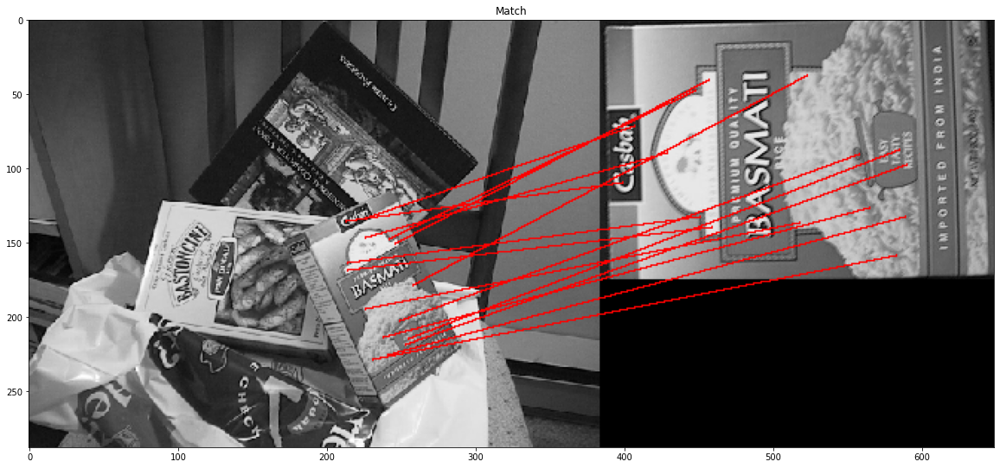

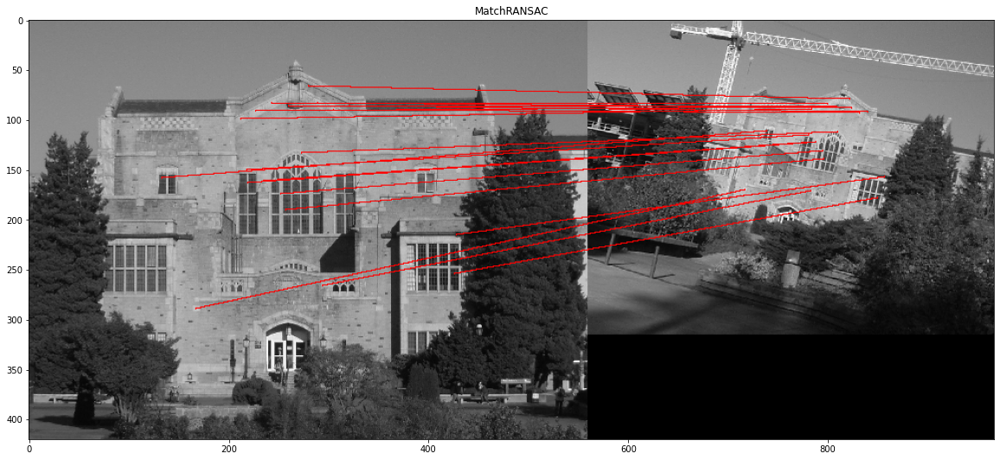

In [ ]:
# Test run matching with no ransac
# Test run matching with no ransac
plt.figure(figsize=(20, 20))
im = Match('scene','basmati', 0.6)
plt.title('Match')
plt.imshow(im)

plt.figure(figsize=(20, 20))
im = MatchRANSAC(
    'library', 'library2',
    ratio_thres=0.6, orient_agreement= 10, scale_agreement=0.1)
plt.title('MatchRANSAC')
plt.imshow(im)





# **Part - 1 Question - 3 Explanation**

When I chose very large value of threshold, I received a lot of false matches. However, a threshold of 0.3 yields no match at all. As result, I chose 0.6 which gave me a good number of true matches and a few false matches.

# **Part - 1 Question - 4 Explanation**

When I decreased the values of orientation agreement and scale agreement, it increased the matching threshold. Many outliers were discarded. Only the inliers that were very close to the first match in terms of orientation and scale agreement were accepted. All these resulted in few false matches and more true matches. However, if I decrease the agreements to a very small value such as orient_agreement= 5, scale_agreement=0.05, a huge portion of the good inliers get discarded. The consensus set becomes very small and only a few true matches get detected.

# Q2: Panorama

In [ ]:
import os.path as op

Contents of test_pano.py

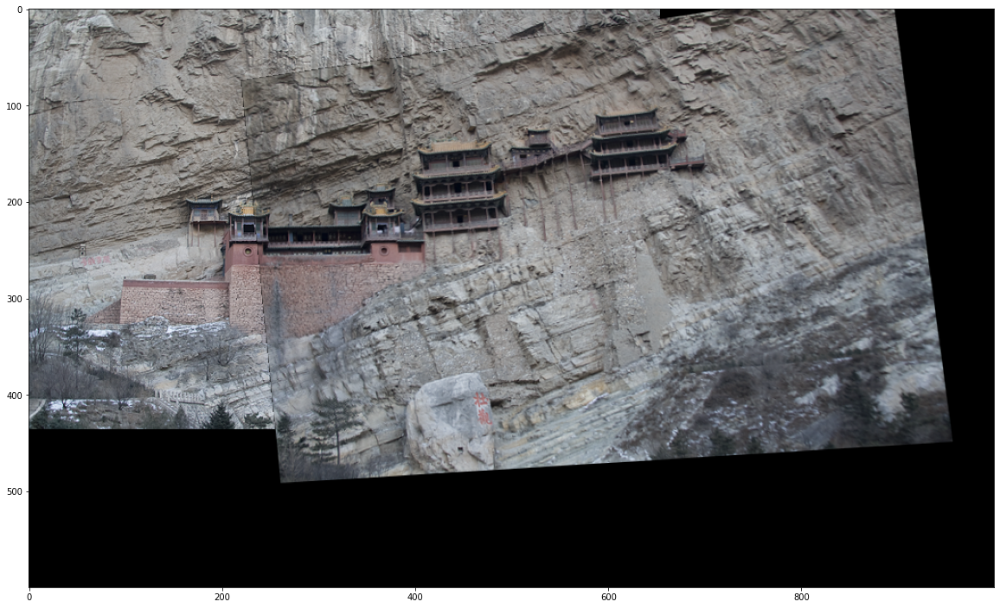

In [ ]:
path = './'
image_list = ['Hanging1', 'Hanging2']
image_list = [op.join(path, im) for im in image_list]
# the dimension of the canvas (numpy array)
# to which we are copying images.
canvas_width = 1000
canvas_height = 600

# some precomputed data for sanity check
with open('./test.pkl', 'rb') as f:
    test_dict = pkl.load(f)
h_gt = test_dict['h']  # the homograph matrix we computed

# matches between the source and the refence image
xy_src = test_dict['xy_src']  # (match, 2)
xy_ref = test_dict['xy_ref']  # (match, 2)

# image_list should store both the reference and the source images
ref_image = image_list[0]  # first element is the reference image
source_image = image_list[1]

# compute the homography matrix to transform the source to the reference
h, _ = cv2.findHomography(xy_src, xy_ref)

# The current computed value should equal to our precomputed one
norm_diff = ((h-h_gt)**2).sum()
assert norm_diff < 1e-7, 'The computed homography matrix should equal to the given one.'

# read the two images as numpy arrays
im_src = np.array(ReadData(source_image)[0])
im_ref = np.array(ReadData(ref_image)[0])

# project source image to the reference image using the homography matrix
# the size of canvas is specified to store all images after projections.
im_src_warp = cv2.warpPerspective(im_src, h, (canvas_width, canvas_height))

# warp_list should contain all images, where the first
# element is the reference image
warp_list = [im_ref, im_src_warp]
result = MergeWarppedImages(canvas_height, canvas_width, warp_list)

# plot the result of the warping
plt.figure(figsize=(20, 20))
plt.imshow(result)
plt.show()

In [ ]:
import sys

Contents of main_proj.py

Press any key to exit the programx


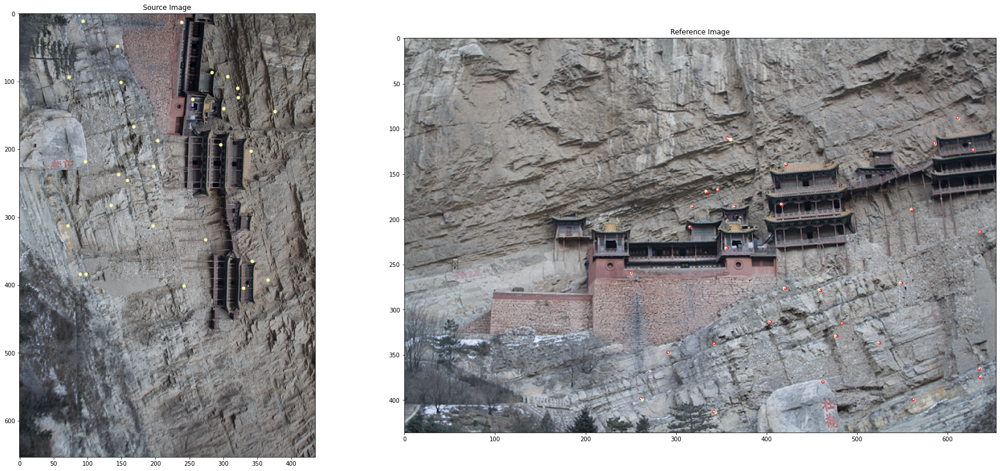

In [ ]:
with open('./test.pkl', 'rb') as f:
    test_dict = pkl.load(f)

# visualize 30 random matches
num_pts = 30
idx = np.random.permutation(test_dict['xy_src'].shape[0])[:num_pts]
xy_src = test_dict['xy_src'][idx]
xy_ref = test_dict['xy_ref'][idx]
h = test_dict['h']
# project the src keypoints to the reference frame using homography
xy_proj = KeypointProjection(xy_src, h)
# visualize the results
im_ref = np.array(Image.open('./Hanging1.png'))
im_src = np.array(Image.open('./Hanging2.png'))

VisualizePointProj(xy_src, xy_ref, xy_proj, im_src, im_ref)

Contents of main_pano.py

In [ ]:
def create_pano(
        image_list, ratio_thres,
        canvas_height, canvas_width,
        num_iter, tol, figsize=(20, 20)):
    """
    This function creates a panorama using a list of images.
    Inputs:
        image_list: a list of str, the path to each image (without file extensions).
        ratio_thres: the ratio test threshold in `FindBestMatches`
        canvas_height, canvas_width: The dimension of the canvas
        num_iter: num of iterations of performing RANSAC to find the homography matrix.
        tol: tolerance for keypoint projection
    """
    # Get the matches from `FindBestMatches`
    # xy_src_list: np.array, (matches, 2) in xy format
    # xy_ref_list: np.array, (matches, 2) in xy format
    # im_list: a list of images in np.array
    xy_src_list, xy_ref_list, im_list = PrepareData(
        image_list, ratio_thres)

    # Use the matches to estimate a homography matrix to the ref image frame
    # for each source image. Then project each source image to the reference
    # frame using the homography matrix.
    wrap_list = ProjectImages(
        xy_src_list, xy_ref_list, im_list,
        canvas_height, canvas_width, num_iter, tol)

    # Merge the projected images above
    # Note: the first element is the reference image in warp_list
    result = MergeWarppedImages(
        canvas_height, canvas_width, wrap_list)

    # show the final panorama
    plt.figure(figsize=figsize)
    plt.imshow(result)
    plt.show()

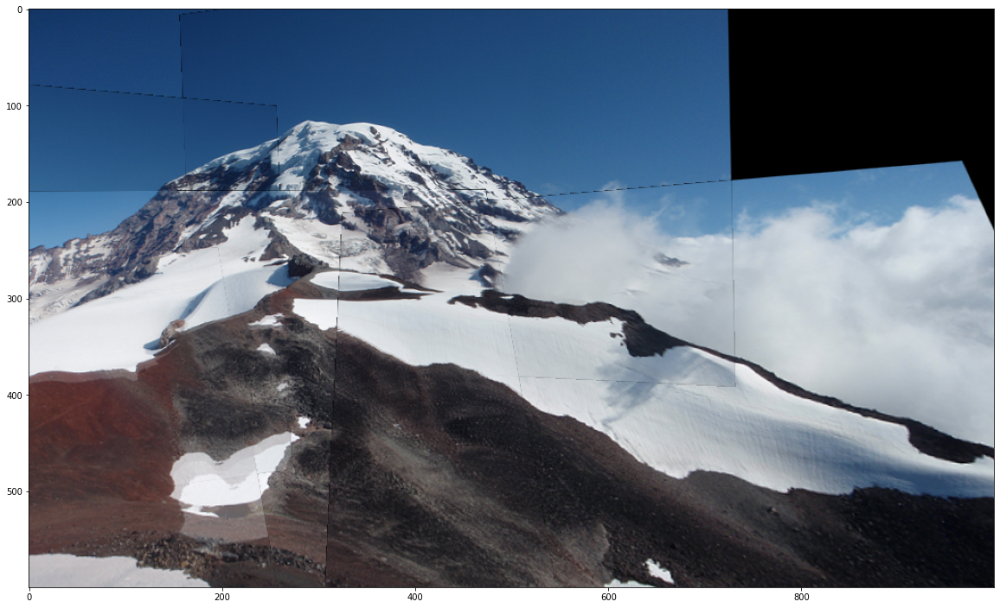

In [ ]:
path = './'

canvas_height = 600
canvas_width = 1000
image_list = ['Rainier1', 'Rainier2', 'Rainier3','Rainier4','Rainier5','Rainier6']

num_iter = 50
tol = 10
ratio_thres = 0.9
image_list = [op.join(path, im) for im in image_list]
create_pano(image_list, ratio_thres, canvas_height, canvas_width,
            num_iter, tol, figsize=(20, 20))

# **Bad result with poor parameter value selection**

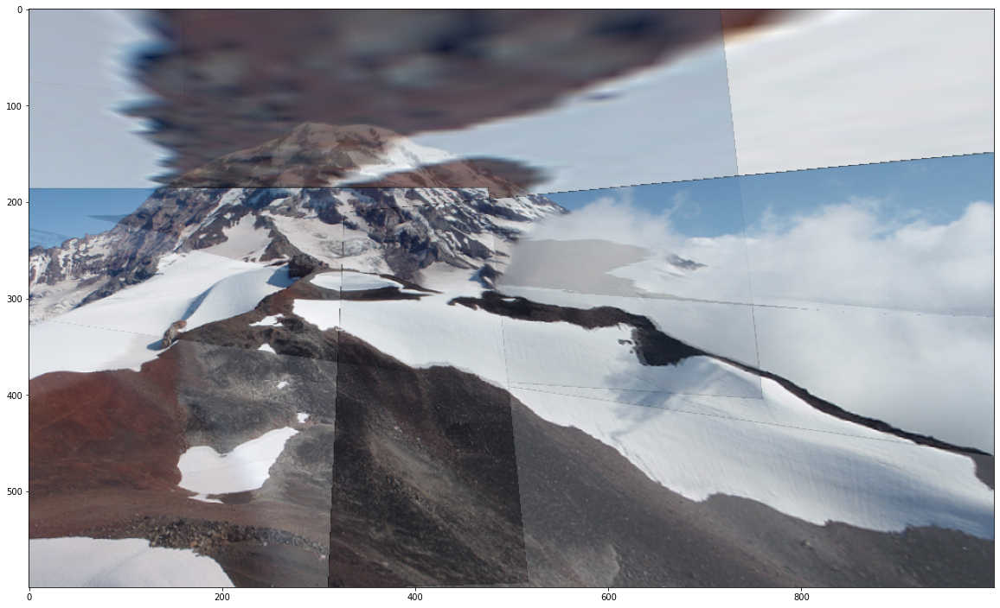

In [ ]:
path = './'

canvas_height = 600
canvas_width = 1000
image_list = ['Rainier1', 'Rainier2', 'Rainier3','Rainier4','Rainier5','Rainier6']

num_iter = 10
tol = 10
ratio_thres = 0.9
image_list = [op.join(path, im) for im in image_list]
create_pano(image_list, ratio_thres, canvas_height, canvas_width,
            num_iter, tol, figsize=(20, 20))

# **Good**

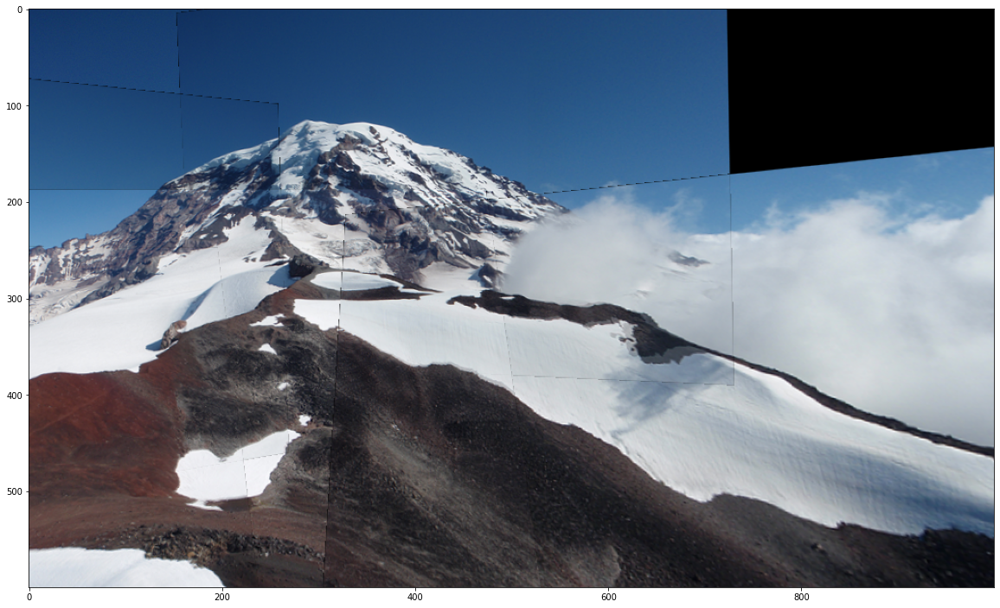

In [ ]:
path = './'

canvas_height = 600
canvas_width = 1000
image_list = ['Rainier1', 'Rainier2', 'Rainier3','Rainier4','Rainier5','Rainier6']

num_iter = 150
tol = 5
ratio_thres = 0.9
image_list = [op.join(path, im) for im in image_list]
create_pano(image_list, ratio_thres, canvas_height, canvas_width,
            num_iter, tol, figsize=(20, 20))


# **Bad result with poor parameter value selection**

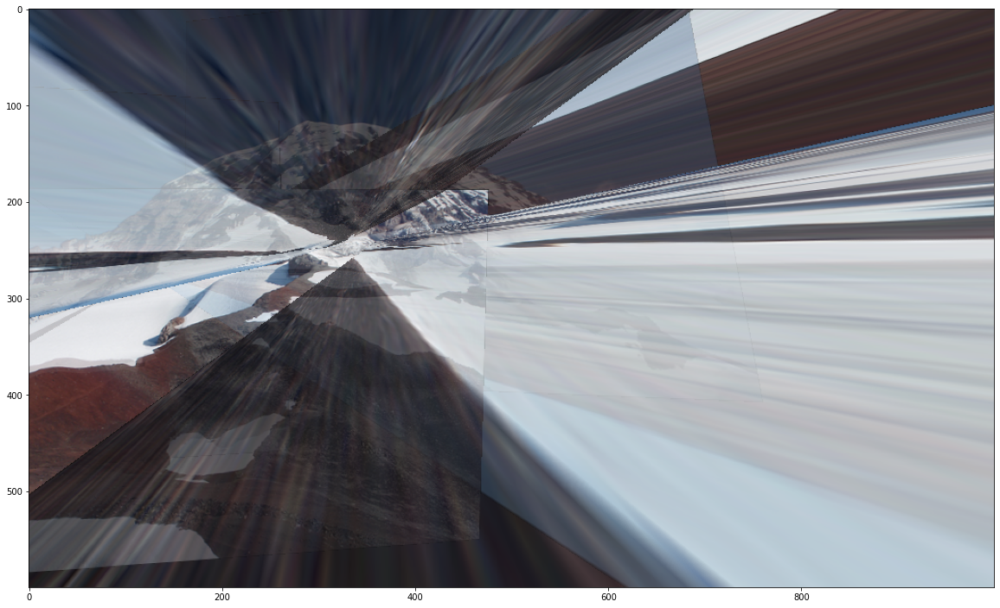

In [ ]:
path = './'

canvas_height = 600
canvas_width = 1000
image_list = ['Rainier1', 'Rainier2', 'Rainier3','Rainier4','Rainier5','Rainier6']

num_iter = 50
tol = 100
ratio_thres = 0.9
image_list = [op.join(path, im) for im in image_list]
create_pano(image_list, ratio_thres, canvas_height, canvas_width,
            num_iter, tol, figsize=(20, 20))

# **Part - 2 Question - 4 Explanation**

I have tried quite a few values for num_iter and tol.

Combination 1: num_iter = 50, tol = 10 **(for comparison)**

Result - good

Combination 2: num_iter = 10, tol = 10 (keeping tol same as combination - 1)

Result - bad

Combination 3: num_iter = 150, tol = 5 (both values changed)

Result - similar to Combination 1

Combination 4: num_iter = 50, tol = 100 (keeping num_iter same as combination - 1)

Result - bad

Explanation - When we decrease the number of iterations, it takes less amount of time because we run the loop less number of times. However, the panorama quality becomes bad. This is because the chances of getting a big consensus set with lot of proper inliers decrease. We may well select a consensus set with many false matches. As a result, exact matches are very difficult to find between the images. Hence, a poor panorama.

When tol is very high, we are considering projected values with very high  Euclidean distance (to its correspondance in the reference frame) as a match. As a result, exact matches are not being considered. This is why we see a poor panorama

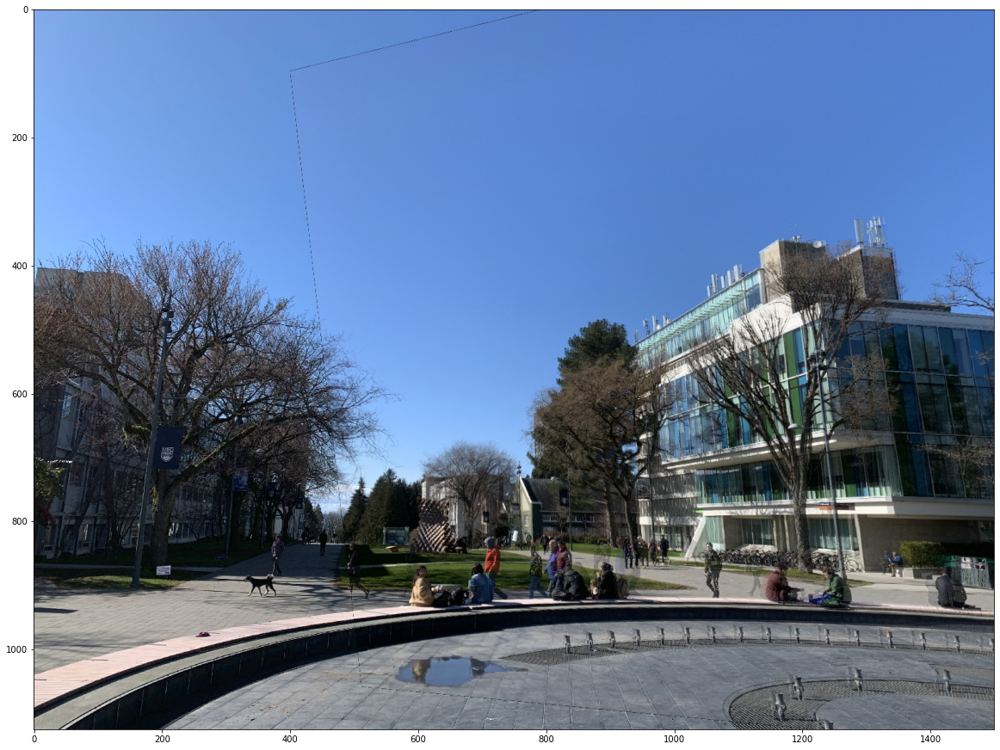

In [ ]:
path = './'

canvas_height = 1125 
canvas_width = 1500
image_list = ['fountain4', 'fountain0']

num_iter = 100
tol = 7
ratio_thres = 0.9
image_list = [op.join(path, im) for im in image_list]
create_pano(image_list, ratio_thres, canvas_height, canvas_width,
            num_iter, tol, figsize=(20, 20))

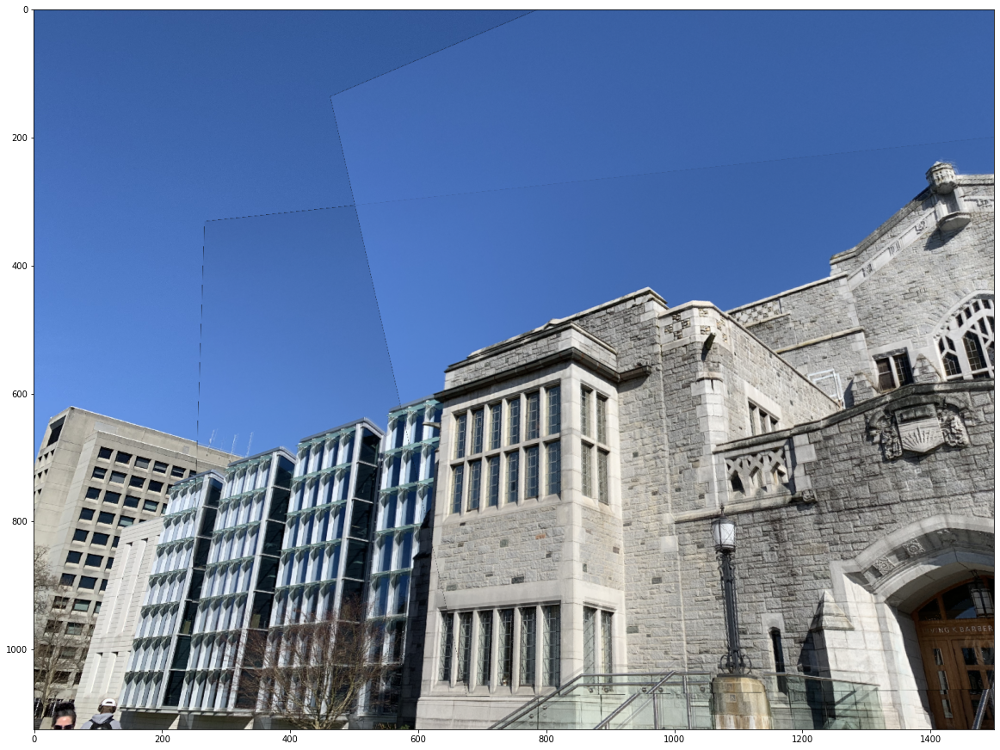

In [ ]:
path = './'

canvas_height = 1125 
canvas_width = 1500
image_list = ['irving_out3', 'irving_out6', 'irving_out5']

num_iter = 50
tol = 5
ratio_thres = 0.6
image_list = [op.join(path, im) for im in image_list]
create_pano(image_list, ratio_thres, canvas_height, canvas_width,
            num_iter, tol, figsize=(20, 20))

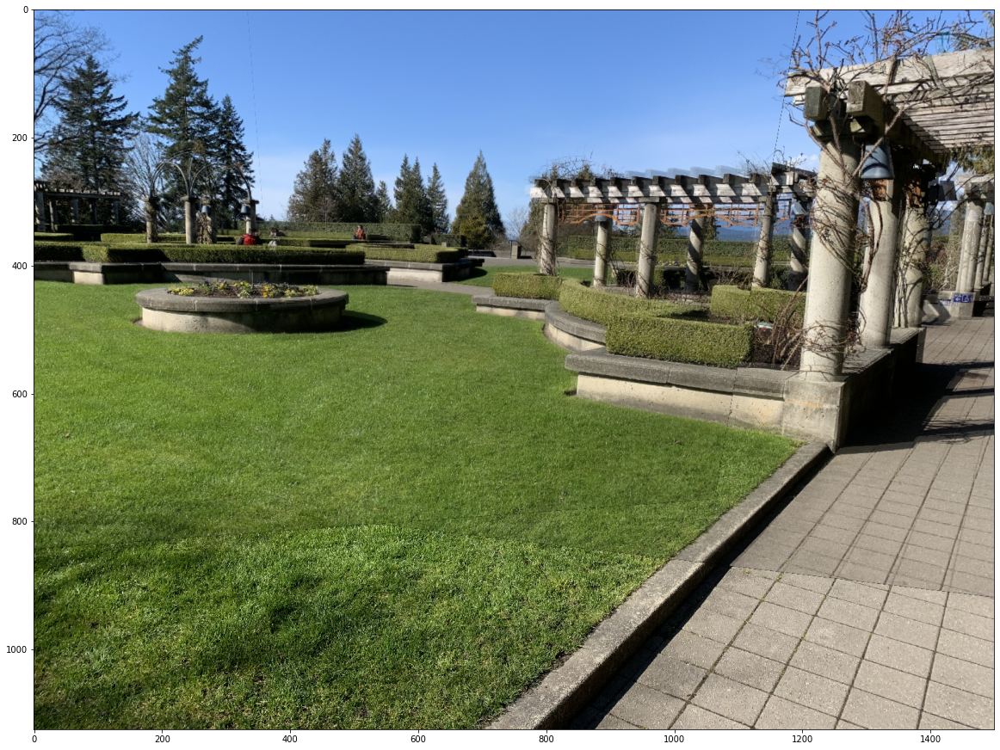

In [ ]:
path = './'

canvas_height = 1125 
canvas_width = 1500
image_list = ['garden0', 'garden3', 'garden4']

num_iter = 150
tol = 10
ratio_thres = 0.6
image_list = [op.join(path, im) for im in image_list]
create_pano(image_list, ratio_thres, canvas_height, canvas_width,
            num_iter, tol, figsize=(20, 20))

In [ ]:
!apt-get install texlive texlive-xetex texlive-latex-extra pandoc
!pip install pypandoc


Reading package lists... Done
Building dependency tree       
Reading state information... Done
pandoc is already the newest version (1.19.2.4~dfsg-1build4).
pandoc set to manually installed.
The following additional packages will be installed:
  fonts-droid-fallback fonts-lato fonts-lmodern fonts-noto-mono fonts-texgyre
  javascript-common libcupsfilters1 libcupsimage2 libgs9 libgs9-common
  libijs-0.35 libjbig2dec0 libjs-jquery libkpathsea6 libpotrace0 libptexenc1
  libruby2.5 libsynctex1 libtexlua52 libtexluajit2 libzzip-0-13 lmodern
  poppler-data preview-latex-style rake ruby ruby-did-you-mean ruby-minitest
  ruby-net-telnet ruby-power-assert ruby-test-unit ruby2.5
  rubygems-integration t1utils tex-common tex-gyre texlive-base
  texlive-binaries texlive-fonts-recommended texlive-latex-base
  texlive-latex-recommended texlive-pictures texlive-plain-generic tipa
Suggested packages:
  fonts-noto apache2 | lighttpd | httpd poppler-utils ghostscript
  fonts-japanese-mincho | fonts-ipa

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
